# Mapping COVID-19 Cases

In this notebook a series of maps containing COVID-19 data are created using pyqgis.

In [1]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from qgis.core import *
from qgis.PyQt.QtGui import *
from qgis.PyQt.QtCore import *
from IPython.display import Image
from qgis.gui import *
from qgis import processing

In [2]:
QgsApplication.setPrefixPath(r'C:\\OSGeo4W64\\apps\\qgis', True)
qgs = QgsApplication([], True)
qgs.initQgis()
sys.path.append(r'C:\OSGeo4W64\apps\qgis\python\plugins')
project = QgsProject.instance()

print(QgsApplication.showSettings())

Application state:
QGIS_PREFIX_PATH env var:		C:/OSGEO4~1/apps/qgis
Prefix:		C:/OSGEO4~1/apps/qgis
Plugin Path:		C:/OSGEO4~1/apps/qgis/plugins
Package Data Path:	C:/OSGEO4~1/apps/qgis/.
Active Theme Name:	
Active Theme Path:	C:/OSGEO4~1/apps/qgis/./resources/themes\\icons/
Default Theme Path:	:/images/themes/default/
SVG Search Paths:	C:\\OSGeo4W64\\apps\\qgis/./svg/
		C:/OSGEO4~1/apps/qgis/./svg/
		C:/Users/eduar/AppData/Roaming/python3\profiles\default/svg/
User DB Path:	C:/OSGEO4~1/apps/qgis/./resources/qgis.db
Auth DB Path:	C:/Users/eduar/AppData/Roaming/python3\profiles\default/qgis-auth.db



In [3]:
# To see the source of the Shapefile .shp please consult the Webgraphy at the bottom of the notebook
path= r"C:\Users\eduar\OneDrive\Ambiente de Trabalho\tpSIG\CNTR_RG_01M_2016_4326\CNTR_RG_01M_2016_4326.shp"
map_layer = QgsVectorLayer(path, 'world_map', 'ogr')

if not map_layer.isValid():
    print("Failed to load the layer!")
else:
    project.addMapLayer(map_layer)
    print("Sucess")

Sucess


In [4]:
# To see the source of the .csv file please consult the Webgraphy at the bottom of the notebook
csv_path = r"file:///C:\Users\eduar\OneDrive\Ambiente de Trabalho\tpSIG\owid-covid-data2.csv?delimiter=;'"
csv_layer = QgsVectorLayer(csv_path, 'Data', 'delimitedtext')

if not csv_layer.isValid():
    print('Layer failed to load!')
else:
    project.addMapLayer(csv_layer)
    print("Sucess")

Sucess


## Joining Layers

Joining the two layers, note that map_layer does not have a geometric column and thus a join of two layers must be done.

In [5]:
QgsProject.instance().addMapLayer(map_layer)
QgsProject.instance().addMapLayer(csv_layer)
csv_iso='iso_code'
shp_iso='ISO3_CODE'

joinObject=QgsVectorLayerJoinInfo()
joinObject.setJoinFieldName(csv_iso)
joinObject.setTargetFieldName(shp_iso)
joinObject.setJoinLayerId(csv_layer.id())
joinObject.setUsingMemoryCache(False)
joinObject.setJoinLayer(csv_layer)
map_layer.addJoin(joinObject)

vlayer = QgsProject.instance().mapLayersByName('world_map')[0]

# Checking if all columns were uploaded
for field in vlayer.fields():
    print("Column "+field.name()+" Load")

Column CNTR_ID Load
Column CNTR_NAME Load
Column NAME_ENGL Load
Column ISO3_CODE Load
Column FID Load
Column Data_location Load
Column Data_date Load
Column Data_total_cases Load
Column Data_new_cases Load
Column Data_total_deaths Load
Column Data_new_deaths Load
Column Data_total_cases_per_million Load
Column Data_new_cases_per_million Load
Column Data_total_deaths_per_million Load
Column Data_new_deaths_per_million Load
Column Data_total_tests Load
Column Data_new_tests Load
Column Data_total_tests_per_thousand Load
Column Data_new_tests_per_thousand Load
Column Data_tests_units Load
Column Data_population Load
Column Data_population_density Load
Column Data_median_age Load
Column Data_aged_65_older Load
Column Data_aged_70_older Load
Column Data_gdp_per_capita Load
Column Data_extreme_poverty Load
Column Data_cvd_death_rate Load
Column Data_diabetes_prevalence Load
Column Data_female_smokers Load
Column Data_male_smokers Load
Column Data_handwashing_facilities Load
Column Data_hospi

## Mapping Total Number of Cases

In [6]:
layer_settings  = QgsPalLayerSettings()
text_format = QgsTextFormat()

text_format.setFont(QFont("Arial", 6))
text_format.setSize(6)

buffer_settings = QgsTextBufferSettings()
buffer_settings.setEnabled(True)
buffer_settings.setSize(1)
buffer_settings.setColor(QColor("white"))

text_format.setBuffer(buffer_settings)
layer_settings.setFormat(text_format)

layer_settings.fieldName = "Data_total_cases"
layer_settings.placement = 2

layer_settings.enabled = True

label_settings = QgsVectorLayerSimpleLabeling(layer_settings)


vlayer.setLabeling(label_settings)
vlayer.setLabelsEnabled(True)
vlayer.triggerRepaint()

Gerar mapa com 1000 por 482
Total number of Cases


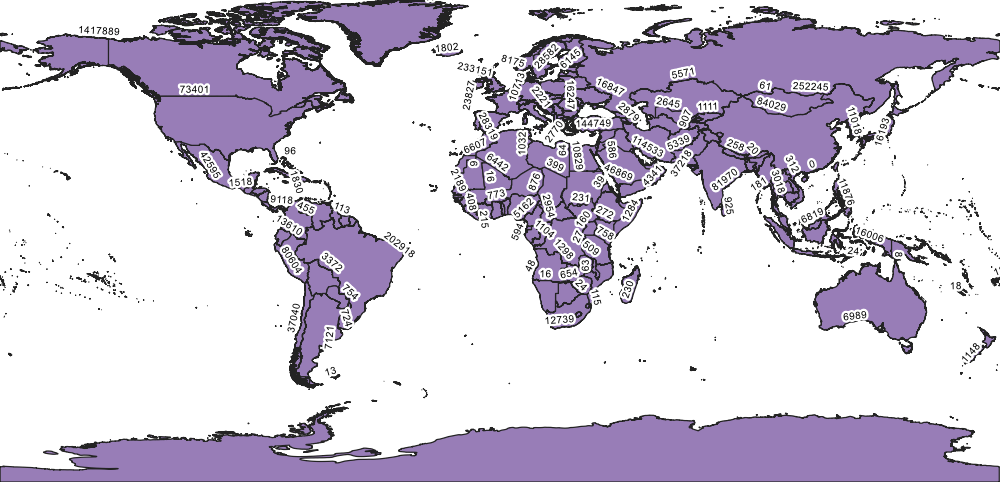

In [7]:
xt = vlayer.extent()
#print(xt)

width  = 1000
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))
print("Total number of Cases")

options = QgsMapSettings()
options.setLayers([vlayer])
options.setBackgroundColor(QColor(255, 255, 255))
options.setOutputSize(QSize(width, height))
options.setExtent(xt)
           
render = QgsMapRendererParallelJob(options)
render.start()
render.waitForFinished()

image = render.renderedImage()

imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )

## Mapping Total Number of Deaths

In [8]:
deaths_layer = map_layer.clone()
deaths_layer.setName("Total deaths")

In [9]:
from qgis.PyQt import QtGui

myOpacity = 1

myTargetField = 'Data_total_deaths'
myRangeList = []

myMin = 0
myMax = 1
myLabel = '0-1'
myColour = QtGui.QColor('#e6e6ff')
mySymbol = QgsSymbol.defaultSymbol(deaths_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

myMin = 1
myMax = 10
myLabel = '1-10'
myColour = QtGui.QColor('#ff6666')
mySymbol = QgsSymbol.defaultSymbol(deaths_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

myMin = 10
myMax = 45.2
myLabel = '10-45.2'
myColour = QtGui.QColor('#ff3333')
mySymbol = QgsSymbol.defaultSymbol(deaths_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

myMin = 45.2
myMax = 275.8
myLabel = '45.2-275.8'
myColour = QtGui.QColor('#cc0000')
mySymbol = QgsSymbol.defaultSymbol(deaths_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)

myMin = 275.8
myMax = 85906
myLabel = '275.8-85906'
myColour = QtGui.QColor('#990000')
mySymbol = QgsSymbol.defaultSymbol(deaths_layer.geometryType())
mySymbol.setColor(myColour)
myRange = QgsRendererRange(myMin, myMax, mySymbol, myLabel)
myRangeList.append(myRange)


myRenderer = QgsGraduatedSymbolRenderer('', myRangeList)
myClassificationMethod = QgsApplication.classificationMethodRegistry().method("EqualCount")
myRenderer.setClassificationMethod(myClassificationMethod)
myRenderer.setClassAttribute(myTargetField)

deaths_layer.setRenderer(myRenderer)

In [10]:
xt = map_layer.extent()
# print(xt)
width  = 2000
height = int(width*xt.height()/xt.width())
print("Gerar mapa com {} por {}".format(width, height))


project = QgsProject().instance()
project.addMapLayers([deaths_layer])
manager = project.layoutManager()
layoutName = 'death'
layouts_list = manager.printLayouts()
for layout in layouts_list:
    if layout.name() == layoutName:
        manager.removeLayout(layout)
        
layout = QgsPrintLayout(project)
layout.initializeDefaults()
layout.setName(layoutName)
manager.addLayout(layout)

pc = layout.pageCollection()
pc.page(0).attemptResize(QgsLayoutSize(width,height,QgsUnitTypes.LayoutMillimeters))


map = QgsLayoutItemMap(layout)
map.setRect(20,20,20,20)
map.setLayers([deaths_layer])



ms = QgsMapSettings()
ms.setLayers([deaths_layer])
ms.setExtent(xt)
map.setExtent(xt)


layout.addLayoutItem(map)



map.attemptMove(QgsLayoutPoint(0,0,QgsUnitTypes.LayoutMillimeters))
map.attemptResize(QgsLayoutSize(width,height,QgsUnitTypes.LayoutMillimeters))


map.setBackgroundColor(QColor(250,250,250))




legend = QgsLayoutItemLegend(layout)

legend.setReferencePoint(6)
legend.setScale(3)
legend.attemptMove(QgsLayoutPoint(0,height,QgsUnitTypes.LayoutMillimeters))

layout.addLayoutItem(legend)
legend.setLegendFilterByMapEnabled(True)

legend.setLinkedMap(map)

Gerar mapa com 2000 por 964


In [11]:
exporter = QgsLayoutExporter(manager.layoutByName("death"))
image = exporter.renderPageToImage(0)
image = exporter.renderPageToImage(0)

from IPython.display import Image
imgbuf= QBuffer()
imgbuf.open( QIODevice.ReadWrite )
image.save( imgbuf,"PNG" )
Image( imgbuf.data() )

### Webgraphy

* World Map ShapeFile: https://github.com/jgrocha/covid-pt/tree/master/Eurostat/Pa%C3%ADses%202016%201M
* COVID-19 Data: https://covid.ourworldindata.org/data/owid-covid-data.csv
* Total Number of Cases Map: https://gis.stackexchange.com/questions/273266/reading-and-setting-label-settings-in-pyqgis-3
* Total Number of Deaths Map: https://github.com/jgrocha/covid-pt/tree/master/Casos%20de%20estudo/COVID-19_USA_statistics